In [1]:
# # Uncomment the following line to create a virtual environment and install dependencies
# !python -m venv myenv
# !pip install -r /path/to/requirements.txt

## Load MIRIAD Dataset

- If you already have access to the MIRIAD dataset on HuggingFace, load the dataset using `load_dataset` would be the most straightforward way

In [ ]:
from datasets import load_dataset

dataset_name = 'miriad/miriad-5.8M'

ds = load_dataset(dataset_name, split='train')

Resolving data files:   0%|          | 0/49 [00:00<?, ?it/s]

Resolving data files:   0%|          | 0/49 [00:00<?, ?it/s]

Loading dataset shards:   0%|          | 0/49 [00:00<?, ?it/s]

- If you haven't got the access to HuggingFace MIRIAD dataset yet, no worries, we provide the data that could be easily download from Google Drive
- Feel free to skip this part if you've already loaded the dataset from huggingface. This section is prepared for reviewing before the public release of MIRIAD

In [ ]:
# install gdown, which is used for google drive downloads
!pip install gdown

In [ ]:
# Download the dataset from Google Drive
!gdown "https://drive.google.com/uc?id=1BPmHR83PvSEQIFlwkyblH0wb0eNRum8a" -O miriad-5.8M-final.zip

In [ ]:
# Unzip the downloaded file
!unzip -o miriad-5.8M-final.zip

In [32]:
# Load the dataset from the unzipped files
from datasets import load_from_disk
data_folder = './miriad-5.8M-final' # path to the unzipped dataset
ds = load_from_disk(data_folder)

Loading dataset from disk:   0%|          | 0/64 [00:00<?, ?it/s]

## RAG Pipeline
- Please note that to run the RAG pipeline, establishing the qdrant vector database locally is a necessary step. We encourage you to follow the instructions in README to setup the qdrant vector database first.

In [38]:
import sys
sys.path.append("..")
from rag_pipeline.src.rag import RAG

import yaml
from rag_pipeline.src.printutils import pcprint, separator

config_path = "../rag_pipeline/eval_config.yaml"
# load the config file
with open(config_path, "r") as f:
    config = yaml.safe_load(f)
print("Loaded config:")
pcprint(config)

Loaded config:
embedding:
  model_names: ['BAAI/bge-large-en-v1.5', 'sentence-transformers/all-MiniLM-L6-v2']
  contents: ['qa']
  model_name: BAAI/bge-large-en-v1.5
  content: qa
llm:
  llm_types: ['mistral', 'llama3']
  llm_type: mistral
  available_devices: [0, 1, 2, 3, 4, 5, 6, 7]
llm_claude:
  model_name: claude-3-5-sonnet-20241022
llm_mistral:
  model_name: mistralai/Mixtral-8x7B-Instruct-v0.1
  batch_size: 32
  max_new_tokens: 1000
  temperature: 0.0
  load_in_8bit: False
  max_length: 32768
llm_llama3:
  model_name: meta-llama/Llama-3.1-8B-Instruct
  batch_size: 32
  max_new_tokens: 1000
  temperature: 0.0
  load_in_8bit: False
  max_length: 8192
qdrant:
  host: localhost
  port: 6333
  collection: miriad_{model_name}_{content}


In [39]:
# setup the retrieval pipeline
embedding_model = config["embedding"]["model_name"] 
model_name_short = embedding_model.split("/")[-1]
content = config["embedding"]["content"]
collection_name = config["qdrant"]["collection"].format(model_name=model_name_short, content=content)

rag = RAG(qdrant_host=config["qdrant"]["host"],
            qdrant_port=config["qdrant"]["port"],
            db_name=collection_name,
            embedding_model=embedding_model)

### Demo for the retrieval results --- Relevant MIRIAD entries

In [40]:
query = "treatment for diabetes"
topk = 3
res = rag(query, topk=topk)

print(f"Top {topk} QA pairs from MIRIAD that are the most relevant for query: '{query}'")
print("="*100, "\n")
for r in res:
    print(r.payload['passage_text'])
    print("-"*100, "\n")

Top 3 QA pairs from MIRIAD that are the most relevant for query: 'treatment for diabetes'

question : what are the different treatment options for diabetes? answer : treatment options for diabetes include lifestyle modifications ( such as healthy eating, regular physical activity, and weight management ), oral medications ( such as metformin, sulfonylureas, and thiazolidinediones ), insulin therapy, and in some cases, bariatric surgery. the choice of treatment depends on the individual's type of diabetes, overall health, and personal preferences.
---------------------------------------------------------------------------------------------------- 

question : what are the current treatments for diabetes? answer : current treatments for diabetes include the use of exogenous insulin and the administration of allopathic drugs, such as sulfonylureas, biguanides, and alpha - glucosidase inhibitors.
----------------------------------------------------------------------------------------------

### Demo for solving 500 question from MedMCQA with the aid of MIRIAD
- Run this section from end to end on a single H200 GPU will take roughly 20 min

1. Load MedMCQA

In [41]:
from rag_pipeline.src.eval_utils import load_standardize_dataset

dataset_name = 'medmcqa'
split = 'dev'
dataset = load_standardize_dataset(dataset_name, split=split)

In [6]:
i = 1111 # an example index
sample = dataset[i]
print(f"|Demo MedMCQA Question|: {sample['question']}")
print(f"|Corresponding Choices|: {sample['choices']}")

|Demo MedMCQA Question|: Fixation period of intrusive luxation injury is?
|Corresponding Choices|: ['2 weeks', '4 weeks', '4 weeks, if semi-rigid & 2 weeks, if rigid', '6-8 weeks']


2. Prepare the question, choices, and prompt augmented by retrieved MIRIAD pairs
- Retrieval in this step will take around 5 second

In [7]:
import sys
import os
from tqdm import tqdm
sys.path.append(os.path.abspath('../rag_pipeline'))
from rag_pipeline.run_evaluation import process_sample
from rag_pipeline.src.llm import Llama3LLM, MistralLLM
import random

In [8]:
# Ensure reproducibility
random.seed(42)

# Randomly sample 500 unique indices from the dataset
random_indices = random.sample(range(len(dataset)), 500)

prompt_list_wRAG = []
raged_samples_wRAG = []
prompt_list_woRAG = []
raged_samples_woRAG = []
for i in tqdm(random_indices): # Iterate over randomly selected indices
    sample = dataset[i]
    # with RAG
    raged_sample_entry, prompts = process_sample(rag, sample, in_context_mode=True, top_k=10, passage_text_comparison_mode=None, tokenizer=None, n_tokens=1000)
    prompt_list_wRAG.append(prompts)
    raged_samples_wRAG.append(raged_sample_entry)
    # without RAG
    raged_sample_entry, prompts = process_sample(rag, sample, in_context_mode=False, top_k=10, passage_text_comparison_mode=None, tokenizer=None, n_tokens=1000)
    prompt_list_woRAG.append(prompts)
    raged_samples_woRAG.append(raged_sample_entry)

100%|██████████| 500/500 [00:08<00:00, 58.89it/s]


3. Instantiate Mixtral-8x7B-Instruct-v0.1 for inference as an example

- Processing the inference for 500 MedMCQA questions (prompts augmented with top-3 MIRIAD QA pairs)

In [9]:
import torch

In [10]:
model = MistralLLM(model_name=config["llm_mistral"]["model_name"],
                                batch_size=config["llm_mistral"]["batch_size"],
                                max_new_tokens=config["llm_mistral"]["max_new_tokens"],
                                temperature=config["llm_mistral"]["temperature"],
                                torch_dtype=torch.bfloat16,
                                load_in_8bit=config["llm_mistral"]["load_in_8bit"],
                                max_length=config["llm_mistral"]["max_length"],
                                rank=0,
                                world_size=1,
                                device_id=0)

INFO:rag_pipeline.src.llm:Initializing model mistralai/Mixtral-8x7B-Instruct-v0.1 on GPU 0


Loading checkpoint shards:   0%|          | 0/19 [00:00<?, ?it/s]

INFO:rag_pipeline.src.llm:Model initialized on GPU 0


In [ ]:
responses_woRAG = model.generate(prompt_list_woRAG, rank=0, world_size=1)
responses_wRAG = model.generate(prompt_list_wRAG, rank=0, world_size=1)

4. Get the evaluation score for the demo 500 questions

In [12]:
from rag_pipeline.src.eval_utils import letter2int
from rag_pipeline.run_evaluation import summarize_evaluation

In [15]:
responses = [responses_wRAG, responses_woRAG]
for j in range(2):
    local_responses = responses[j]
    raged_samples = (raged_samples_wRAG if j == 0 else raged_samples_woRAG)
    for i, res in enumerate(local_responses):
        raged_samples[i].llm_res = res
        try:
            raged_samples[i].pred_label = letter2int(res["choice"])
        except Exception as e:
            print(f"Something's wrong with the response: {res}")
            raged_samples[i].pred_label = letter2int(None)
        raged_samples[i].is_correct = raged_samples[i].pred_label == raged_samples[i].gold_label
    score = summarize_evaluation(raged_samples)
    if j == 0:
        print(f"RAG Content: {config['embedding']['content']}, embedding model: {config['embedding']['model_name']}, LLM: {config['llm_mistral']['model_name']}")
    print(f"Evaluation score for {'with' if j == 0 else 'without'} RAG: {score}")

Accuracy: 58.600%
RAG Content: qa, embedding model: BAAI/bge-large-en-v1.5, LLM: mistralai/Mixtral-8x7B-Instruct-v0.1
Evaluation score for with RAG: {'accuracy': 0.586}
Accuracy: 54.600%
Evaluation score for without RAG: {'accuracy': 0.546}


### Demo for MIRIAD Atlas
- Check out the demo of 300k MIRIAD subset on our [project page](https://med-miriad.github.io/demo/).

In [16]:
from IPython.display import Image

- The Atlas looks like

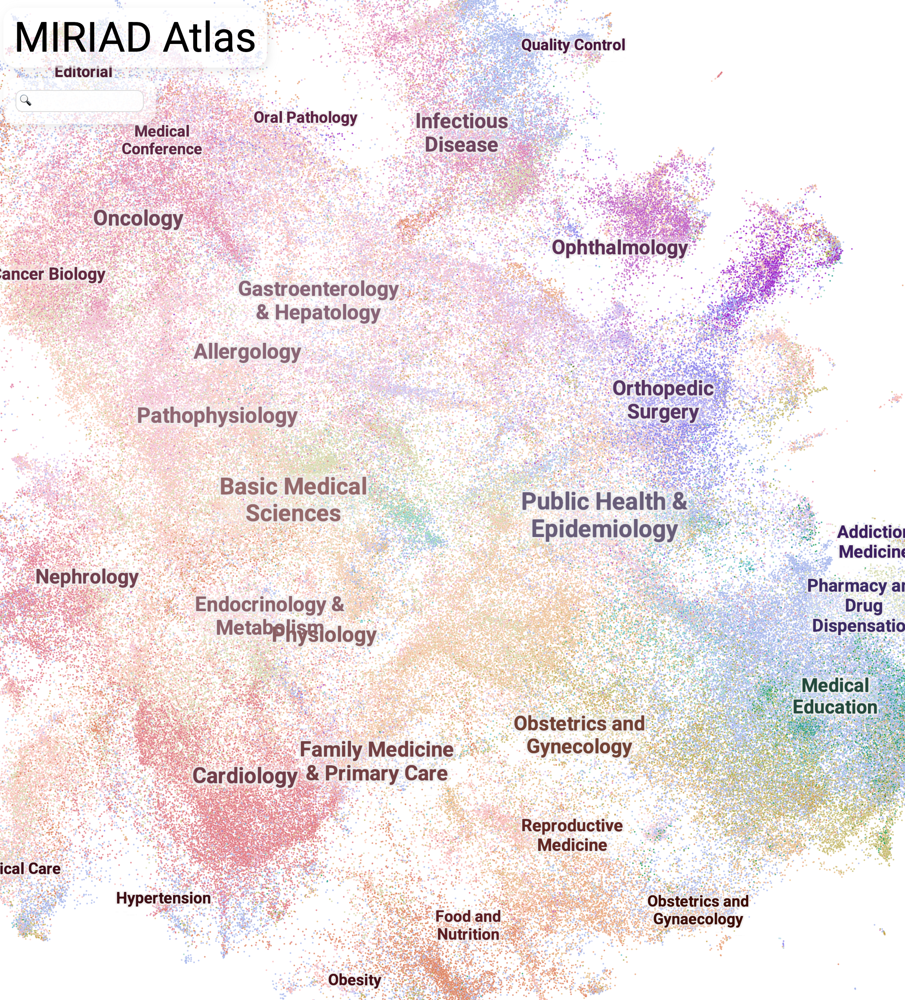

In [17]:
Image(filename='/links/groups/mmoor/projects/miriad/MIRIAD_official/.github/miriad_atlas.png', width=300)